In [1]:
import os
import joblib
import pickle
import dill

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import pandas as pd
from pingouin import mixed_anova, anova, pairwise_tukey, pairwise_ttests
import pingouin as pg
from statsmodels.regression.mixed_linear_model import MixedLM

import TwoPUtils as tpu
import STX3KO_analyses as stx
from STX3KO_analyses import utilities as u



plt.rcParams['pdf.fonttype']=42
ko_mice = stx.ymaze_sess_deets.ko_mice

ctrl_mice = stx.ymaze_sess_deets.ctrl_mice
# ctrl_mice = [m for m in ctrl_mice if m not in ('mCherry6')]

%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
#  write HSE to be any stopping period > 1 sec

#  Plot some examples
#  sort by whether cell participates or not
#  sort within participants and non-participants by location of place field


#  Plot size of events and proportion greater than chance

#  Frequency & duration of events

# % of population in HSEs

# % of HSEs that each cell participates in 

# activity rate of participants vs non-participants

# trial x trial correlation of participants vs non-participants
    # get some examples
    

# predicting stability across days from HSE participation

In [3]:
class HSE:
    
    def __init__(self, sess):
        
        if isinstance(sess.scan_info,list):
            self.frame_rate = sess.scan_info[0]['frame_rate']
        else:
            self.frame_rate = sess.scan_info['frame_rate']
        
        
        
        
        self.spks = sess.timeseries['spks']
        self.trial_mat = sess.trial_matrices['spks_nostop']
        self.speed = sess.timeseries['speed']
        self.lr = sess.timeseries['LR'].ravel()
        self.t = sess.timeseries['t'].ravel()
        self.reward = sess.timeseries['reward'].ravel()
        self.block_number = sess.timeseries['block_number'].ravel()
        
        self.novel_arm = sess.novel_arm
        self.trial_info = sess.trial_info
        self.trial_start_inds = sess.trial_start_inds
        self.teleport_inds = sess.teleport_inds
        
        
        # mask for post reward epochs
        self.post_reward_bool = None
        self.post_reward_epochs = None
        self._post_reward_mask(sess)
        
        
        # threshold spks timeseries to get "significant" transients
        self.thresh_spks = .2*np.nanmax(sess.timeseries['spks'], axis=-1, keepdims=True)
        self.spks_th = 1.*np.copy(self.spks)
        self.spks_th[self.spks<self.thresh_spks]=0
        
        
        
        # all activations during stopping, including periods when not near reward zone
        self.activation_mask = None
        # activations during reward consumption
        self.post_reward_activation_mask = None
        # all activations during running
        self.trial_activation_mask = None
        self.get_activations()
        
        boxcar = np.ones([1,4]) # 500 ms window
        self.post_reward_activation_boxcar = sp.signal.convolve(self.post_reward_activation_mask,boxcar,mode='same')
        self.pop_coactivity_boxcar = self.post_reward_activation_boxcar.sum(axis=0)
        
        self._rng = np.random.default_rng()
        
        self.coactivity_thresh = None
        self.shuff_results = None
        self.post_reward_coactivity_mask = None
        self.pop_coactivity_th = None
        if self.post_reward_epochs.shape[0]>0:
            self.get_popact_thresh()
        
            self.post_reward_coactive_mask = np.copy(self.post_reward_activation_boxcar)
            self.post_reward_coactive_mask[:,self.pop_coactivity_boxcar<self.coactivity_thresh]=0

            self.pop_coactivity_th = np.zeros(self.pop_coactivity_boxcar.shape)
            self.pop_coactivity_th[self.pop_coactivity_boxcar>=self.coactivity_thresh]=1
        
        
        
        # active during trial and during reward consumption
#         self.post_reward_reactivation_mask = None
#         # active during trial but not during reward consumption
#         self.non_reactivation_mask = None
#         self.get_post_reward_reactivations()
        
        
    def _post_reward_mask(self, sess, max_post_reward_time = 10, max_post_reward_dist = 3):
        post_reward_bool = 0.*self.t.ravel()
        for start,stop in zip(self.trial_start_inds, self.teleport_inds):

            cum_reward = np.cumsum(self.reward.ravel()[start:stop])>0
            post_reward_inds = np.argwhere(cum_reward).ravel()
            if post_reward_inds.shape[0]>0:
                post_reward_bool[post_reward_inds[0]+start:start+np.minimum(post_reward_inds[0]+int(max_post_reward_time*self.frame_rate),stop-start)] = 1


        nov_post_rzone_mask = (sess.timeseries['LR']==sess.novel_arm)*(sess.timeseries['t']>sess.rzone_nov['tfront']+max_post_reward_dist)
        fam_post_rzone_mask = (sess.timeseries['LR']==-1*sess.novel_arm)*(sess.timeseries['t']>sess.rzone_fam['tfront']+max_post_reward_dist)
        speed_mask = self.speed.ravel()>=2
        
        post_reward_bool[nov_post_rzone_mask.ravel()]=0
        post_reward_bool[fam_post_rzone_mask.ravel()]=0
        post_reward_bool[speed_mask] = 0
        
        
        
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[1:] = post_reward_bool
        post_reward_starts = np.argwhere(_post_reward_bool[1:]>_post_reward_bool[:-1]).ravel()
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[:-1] = post_reward_bool
        post_reward_ends = np.argwhere(_post_reward_bool[:-1]>_post_reward_bool[1:]).ravel()
        assert post_reward_starts.shape[0]==post_reward_ends.shape[0], "post reward starts and ends screwed up"
        
        
        
        # filter for post reward periods greater than 1 sec
        epoch_mask = (post_reward_ends-post_reward_starts)/self.frame_rate>1
        post_reward_starts, post_reward_ends = post_reward_starts[epoch_mask], post_reward_ends[epoch_mask]
        
        post_reward_epochs = np.zeros([post_reward_starts.shape[0],2])
        post_reward_epochs[:, 0] = post_reward_starts
        post_reward_epochs[:, 1] = post_reward_ends
        self.post_reward_epochs = post_reward_epochs
        # print(self.post_reward_epochs.shape)
        
        
        
        self.post_reward_bool = np.zeros(post_reward_bool.shape)
        for start, stop in zip(post_reward_starts, post_reward_ends):
            self.post_reward_bool[start:stop] = 1
            
        self.post_reward_starts = [int(ind) for ind in post_reward_starts]
        self.post_reward_ends = [int(ind) for ind in post_reward_ends]
        
        
    def get_activations(self):
    
        spks_ledge = 1*(np.diff(1.*(self.spks_th>0),prepend=0,axis=-1)>0)

        self.activation_mask = 1*(spks_ledge>0)*(self.speed<2)
        self.post_reward_activation_mask = 1*(spks_ledge>0)*(self.speed<2)*(self.post_reward_bool[np.newaxis,:])
        self.trial_activation_mask = 1*(spks_ledge>0)*(1-self.post_reward_bool[np.newaxis,:])
        
    @staticmethod
    def shuff_act(post_reward_activation_mask, post_reward_epochs, rng, post_reward_bool, bin_edges=np.arange(51)):
        
        act = 1*np.copy(post_reward_activation_mask)
        for ep_ind in range(post_reward_epochs.shape[0]):
            start, stop = [int(s) for s in post_reward_epochs[ep_ind,:]]

            _act = act[:,start:stop]
            shifts = rng.integers(0,stop-start, (_act.shape[0],))

            for cell in range(_act.shape[0]):
                _act[cell,:] = np.roll(_act[cell,:], shifts[cell])
            act[:,start:stop]=_act

        boxcar = np.ones([4,]) # 250 ms window - results in 500 ms coincidence
        pop_act_boxcar = sp.signal.convolve(act.sum(axis=0), boxcar, mode='same')
        return np.histogram(pop_act_boxcar[post_reward_bool>0], bin_edges)[0]

    def get_popact_thresh(self, nperms = 1000, p_thresh=.95):
        self.bin_edges = np.arange(100)
        
        
        results = np.array(joblib.Parallel(n_jobs=-1)(joblib.delayed(self.shuff_act)(self.post_reward_activation_mask, 
                                                                                     self.post_reward_epochs, 
                                                                                     self._rng,
                                                                                     self.post_reward_bool,
                                                                                     bin_edges=self.bin_edges) for i in range(nperms)))
        # with Pool() as p
        #     results = np.array(p.starmap(self.shuff_act, range(nperms), ))
            
        shuff_hist = results.sum(axis=0)
        shuff_hist = shuff_hist/shuff_hist.sum()
        self.coactivity_thresh = self.bin_edges[:-1][np.argwhere(np.cumsum(shuff_hist)>p_thresh).ravel()[0]]
        self.shuff_results = results
        
        
        
    

        

In [ ]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
os.makedirs(basedir, exist_ok=True)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            print(mouse,day)
            filename = basedir + f'{mouse}_day{day}.pkl'
            if True: #not os.path.exists(filename):
                hse = HSE(u.load_single_day(mouse,day,verbose=False))

                with open(filename, 'wb') as file:
                    pickle.dump(hse,file)
                
            hse_dict[cond_key][day][mouse]=filename
                                                               

4467331.1 0
4467331.2 0
4467332.1 0
4467332.2 0
4467333.1 0
mCherry6 0
mCherry7 0
mCherry8 0
mCherry9 0
4467331.1 1
4467331.2 1
4467332.1 1
4467332.2 1
30_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
4467333.1 1
mCherry6 1
mCherry7 1
mCherry8 1
mCherry9 1
4467331.1 2
4467331.2 2
4467332.1 2
4467332.2 2
4467333.1 2
mCherry6 2
mCherry7 2
mCherry8 2
mCherry9 2
4467331.1 3
4467331.2 3
02_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
4467332.1 3
4467332.2 3
4467333.1 3
mCherry6 3
mCherry7 3
mCherry8 3
mCherry9 3
4467331.1 4


In [4]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            filename = basedir + f'{mouse}_day{day}.pkl'
            hse_dict[cond_key][day][mouse]=filename

# Proportion of eligible stopping periods with a highly synchronous event

In [ ]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 'nov_prop_sig_events':[], 'fam_prop_sig_events': [], 'tot_prop_sig_events':[]}
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
            nov_N, nov_sig_counter = 0, 0
            fam_N, fam_sig_counter = 0, 0
            for start, stop in zip(hse.post_reward_starts, hse.post_reward_ends):
                nov_bool = hse.lr[start]==hse.novel_arm
                if nov_bool:
                    nov_N += 1
                    nov_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                else:
                    fam_N += 1
                    fam_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                    
            nov_N, fam_N = np.maximum(nov_N, 1E-5), np.maximum(fam_N, 1E-5)
                    
            df['ctrl/cre'].append(cond_key)
            df['day'].append(day)
            df['mouse'].append(mouse)
            df['m'].append(m)
            df['nov_prop_sig_events'].append(float(nov_sig_counter)/nov_N)
            df['fam_prop_sig_events'].append(float(fam_sig_counter)/fam_N)
            df['tot_prop_sig_events'].append(float(nov_sig_counter+fam_sig_counter)/(nov_N + fam_N))
df = pd.DataFrame(df)
                    

                    
                
                

In [ ]:
df.to_pickle(f'{basedir}/prop_active_df.pkl')

In [ ]:
df = pd.read_pickle(f'{basedir}/prop_active_df.pkl')

In [ ]:
mask = (df['ctrl/cre']=='ctrl')*(df['day']==0)
df[mask]

In [ ]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['tot_prop_sig_events'], color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['tot_prop_sig_events'], color='red', s=5)

ax.set_ylabel('Proportion')
ax.set_title('Fraction of eligible stopping periods with HSE')
ax.set_xlabel('Days')




In [ ]:
aov = mixed_anova(data=df, dv='nov_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

In [ ]:
aov = mixed_anova(data=df, dv='fam_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

# Proportion of population that participates aka size of events

# Proportion of events a cell participates in within day

# Example Events

In [11]:
cond_key = 'ctrl'
mouse = ctrl_mice[0]
day = 0

# cond_key = 'cre'
# mouse = ko_mice[6]
# day = 1
# hse = HSE(u.load_single_day(mouse,day))
with open(hse_dict[cond_key][day][mouse], 'rb') as file:
    hse = pickle.load(file)

0.023758891251741583


Text(0.5, 0.98, '4467331.1, 0')

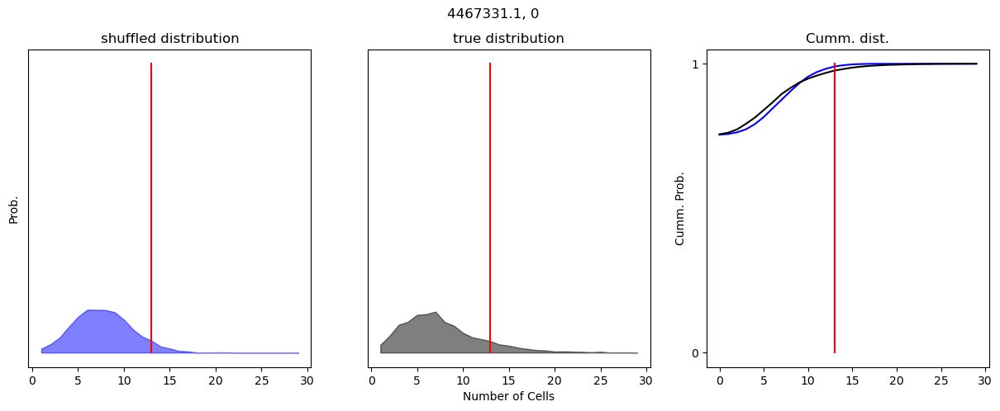

In [12]:
fig, ax = plt.subplots(1,3, figsize=[15,5])

shuff_res = hse.shuff_results.sum(axis=0)
shuff_res = shuff_res/shuff_res.sum()
ax[0].fill_between(hse.bin_edges[1:30], shuff_res[1:30], color='blue', alpha=.5)
ax[0].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
pop_counts = pop_counts/pop_counts.sum()

c = {'ctrl':'black', 'cre':'red'}[cond_key]
ax[1].fill_between(hse.bin_edges[1:30], pop_counts[1:30], color=c, alpha=.5)
ax[1].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

x = np.arange(30)
ax[2].plot(x, np.cumsum(shuff_res[:30]), color='blue')
ax[2].plot(x, np.cumsum(pop_counts[:30]), color=c)
ax[2].plot(hse.coactivity_thresh*np.array([1,1]), [0,1], color='red')
thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
print(pop_counts[thresh_bin:].sum())
# ax[2].plot(x,)



ax[0].set_yticks([])
ax[1].set_yticks([])
ax[2].set_yticks([0,1])

ax[0].set_title('shuffled distribution')
ax[1].set_title('true distribution')
ax[2].set_title('Cumm. dist.')
ax[0].set_ylabel('Prob.')
ax[2].set_ylabel('Cumm. Prob.')

ax[1].set_xlabel('Number of Cells')
fig.suptitle(f'{mouse}, {day}')

/tmp/ipykernel_2652044/3556298612.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(3,1, sharex=True)


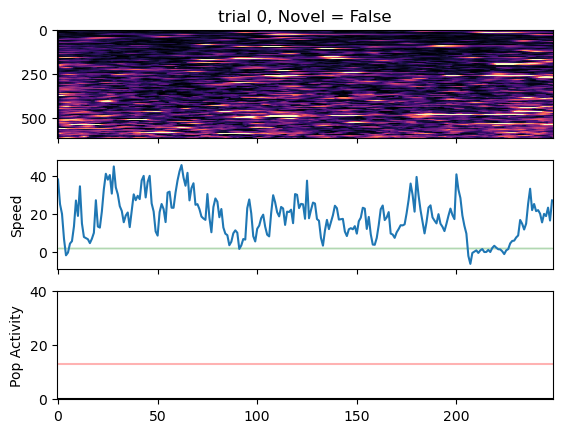

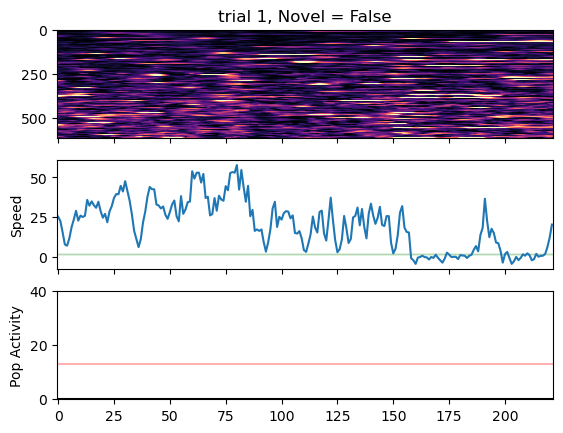

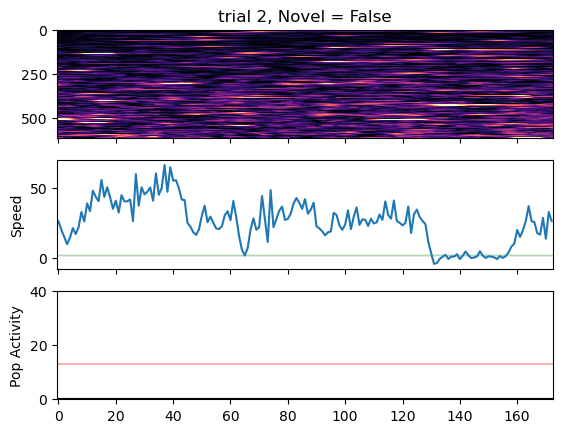

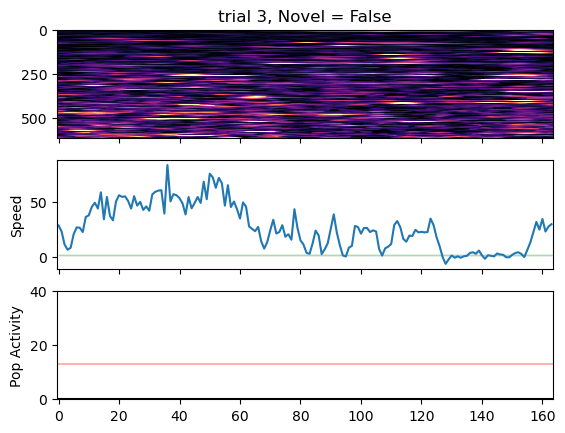

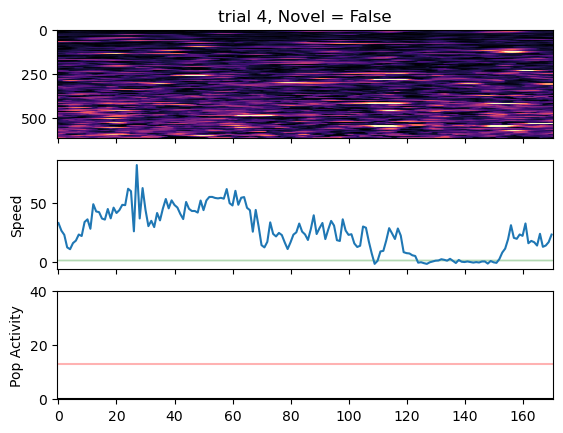

...

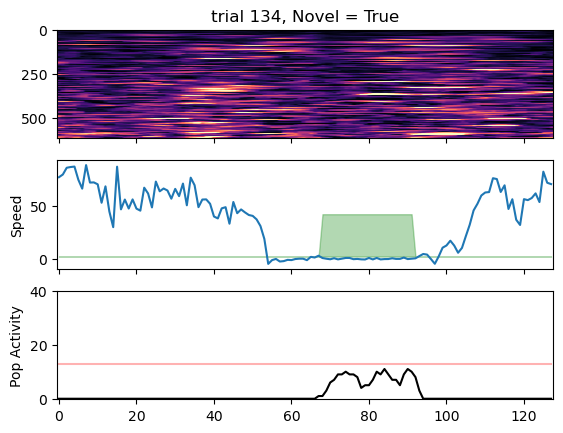

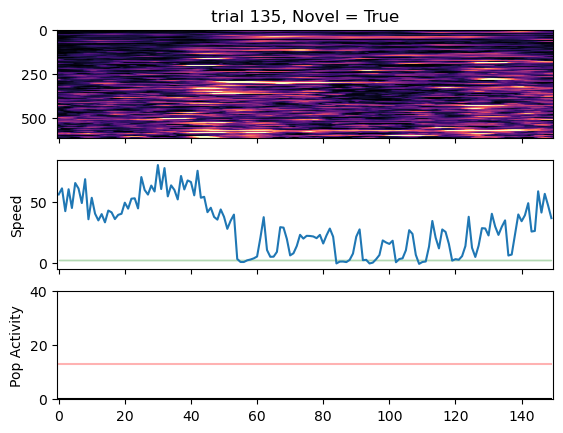

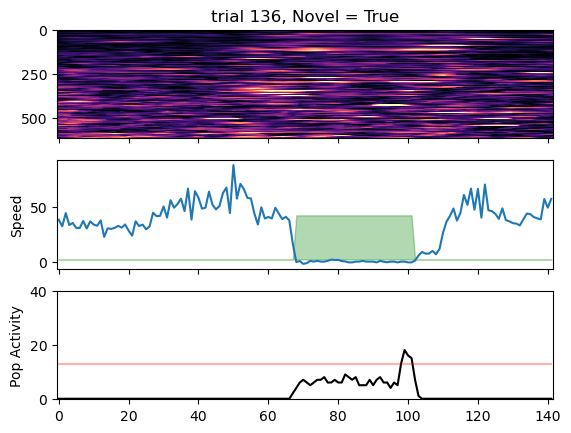

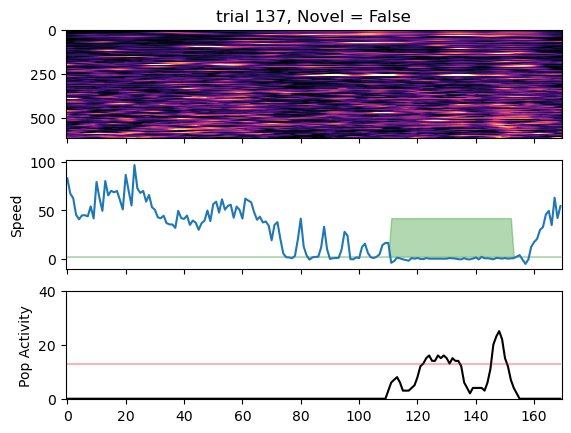

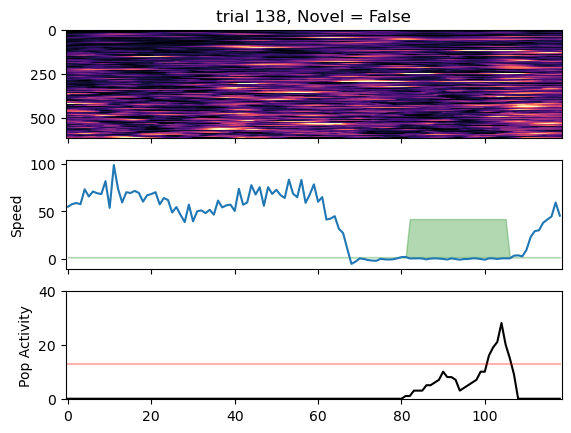

In [13]:

# ax.plot(hse.pop_coactivity_boxcar)
cell_mask = hse.post_reward_coactive_mask.sum(axis=-1)>0
for i, (start, stop) in enumerate(zip(hse.trial_start_inds[:], hse.teleport_inds[:])):
    fig,ax = plt.subplots(3,1, sharex=True)
    nov = hse.trial_info['LR'][i] == hse.novel_arm
    ax[0].set_title(f'trial {i}, Novel = {nov}')
    x = np.arange(stop-start)
    ax[0].imshow(hse.spks[cell_mask, :][:,start:stop]/np.nanpercentile(hse.spks[cell_mask,:],99, axis=-1, keepdims=True), aspect = 'auto', cmap='magma', vmin=.0, vmax=.5)
    ax[1].set_ylabel('Speed')
    # ax[0].imshow(hse.post_reward_activation_boxcar[cell_mask, :][:,start:stop], aspect = 'auto', cmap='magma', vmin=0, vmax=1)
    ax[1].plot(hse.speed.ravel()[start:stop])
    ax[1].fill_between(x,2, 2+40*hse.post_reward_bool[start:stop], color='green', alpha=.3)
    ax[2].plot(hse.pop_coactivity_boxcar[start:stop], color='black')
    ax[2].set_ylim([-.2,40])
    ax[2].plot(np.arange(stop-start),hse.coactivity_thresh*np.ones([stop-start,]), color='red', alpha=.3)
    ax[2].set_ylabel('Pop Activity')

In [18]:
hse.post_reward_coactive_mask.shape

(1381, 34310)

# Proportion of distribution greater than chance

In [13]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'tail_weight':[]}


for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                    thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
                    pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
                    pop_counts = pop_counts/pop_counts.sum()
                    tail_weight = pop_counts[thresh_bin:].sum()
                    
                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)
                    df['tail_weight'].append(tail_weight)
                    
df = pd.DataFrame(df)

                    


KeyboardInterrupt: 

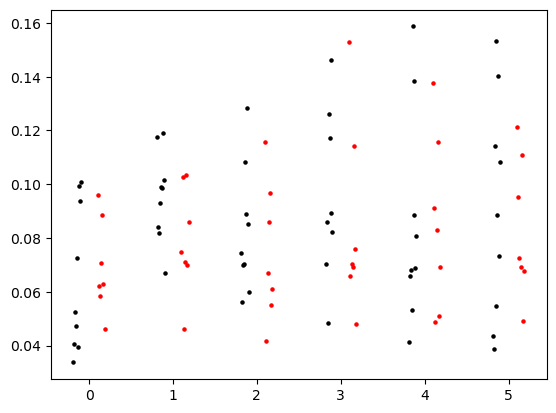

In [5]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['tail_weight'], color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['tail_weight'], color='red', s=5)

# Frequency and duration of events
## fam v novel

# Proportion of population that participates in HSE
## fam v novel

# Proportion of events that each cell participates in
## fam v novel

# Activity rate of reactivated cells vs not 

In [14]:

df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                
                    nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                    nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                    nov_spks = hse.trial_mat[nov_trial_mask, :, :]
                    nov_activated = np.nanmean(np.nanmean(nov_spks[:, :, nov_cell_mask], axis=0), axis=0)
                    nov_nonactivated = np.nanmean(np.nanmean(nov_spks[:, :, ~nov_cell_mask], axis=0), axis=0)

                    fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                    fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                    fam_spks = hse.trial_mat[fam_trial_mask, :, :]
                    fam_activated = np.nanmean(np.nanmean(fam_spks[:, :, fam_cell_mask], axis=0), axis=0)
                    fam_nonactivated = np.nanmean(np.nanmean(fam_spks[:, :, ~fam_cell_mask], axis=0), axis=0)

                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)

                    df['nov_activated'].append(nov_activated.mean())
                    df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                    df['nov_nonactivated'].append(nov_nonactivated.mean())
                    df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                    df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                    df['fam_activated'].append(fam_activated.mean())
                    df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                    df['fam_nonactivated'].append(fam_nonactivated.mean())
                    df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                    df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)


/tmp/ipykernel_2652044/2323905279.py:34: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_2652044/2323905279.py:40: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

KeyboardInterrupt



In [ ]:
df.to_pickle(f'{basedir}/activity_rate_df.pkl')

In [ ]:
df = pd.read_pickle(f'{basedir}/activity_rate_df.pkl')

In [ ]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='black', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='black', s=5, alpha=.5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='red', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='red', s=5, alpha=.5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

ax[0].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)

ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel('Firing Rate (replayed - non-replayed)')

# mask = df['ctrl/cre']=='cre'
# _df = df[mask]
# x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax.scatter(x, _df['tot_prop_sig_events'], color='red', s=5)

In [67]:
aov = mixed_anova(data=df, dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source            SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  8.898274e-07    1   10  8.898274e-07  0.274845  0.611522   
1          day  6.505933e-06    5   50  1.301187e-06  1.846355  0.120792   
2  Interaction  2.439239e-06    5   50  4.878478e-07  0.692245  0.631667   

        np2       eps  
0  0.026749       NaN  
1  0.155858  0.494955  
2  0.064743       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in scalar divide
  W = np.product(eig) / (eig.sum() / d) ** d


In [68]:
aov = mixed_anova(data=df, dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source            SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  2.279723e-07    1   14  2.279723e-07  0.217942  0.647794   
1          day  2.673890e-06    5   70  5.347779e-07  1.213859  0.311775   
2  Interaction  9.985272e-07    5   70  1.997054e-07  0.453299  0.809514   

        np2       eps  
0  0.015329       NaN  
1  0.079786  0.385128  
2  0.031363       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in scalar divide
  W = np.product(eig) / (eig.sum() / d) ** d


# Trial x trial correlation of reactivated vs not

In [15]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            print(mouse,day)
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
            
            if hse.post_reward_epochs.shape[0]>0:
                tt_corr_mat = sp.stats.zscore(hse.trial_mat, axis=1, nan_policy='omit')
                tt_corr_mat[np.isnan(tt_corr_mat)]=0
                tt_corr_mat = 1/(hse.trial_mat.shape[1]-1)*np.matmul(np.transpose(tt_corr_mat, axes=(2, 0, 1)), np.transpose(tt_corr_mat, axes=(2, 1, 0)))

                for cell in range(tt_corr_mat.shape[0]):
                    _mat = tt_corr_mat[cell,:, :]
                    _mat[np.diag_indices_from(_mat)]=np.nan
                    tt_corr_mat[cell, :, :] = _mat
                # tt_corr_mat[:,np.diag_indices(tt_corr_mat.shape[1])]=np.nan

                print(tt_corr_mat.shape)

                nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                # nov_cell_mask = hse.post_reward_coactive_mask[:,:].sum(axis=-1)>0
                nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                nov_activated = np.nanmean(np.nanmean(tt_corr_mat[nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)
                nov_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)

                fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                # fam_cell_mask = hse.post_reward_coactive_mask[:,:].sum(axis=-1)>0
                fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                fam_activated = np.nanmean(np.nanmean(tt_corr_mat[fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)
                fam_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)

                df['ctrl/cre'].append(cond_key)
                df['day'].append(day)
                df['mouse'].append(mouse)
                df['m'].append(m)

                df['nov_activated'].append(nov_activated.mean())
                df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                df['nov_nonactivated'].append(nov_nonactivated.mean())
                df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                df['fam_activated'].append(fam_activated.mean())
                df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                df['fam_nonactivated'].append(fam_nonactivated.mean())
                df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)

4467331.1 0
(1381, 139, 139)
4467331.2 0
(1283, 140, 140)
4467332.1 0
(1568, 138, 138)
4467332.2 0
(1694, 100, 100)
4467333.1 0
(1554, 140, 140)
mCherry6 0
(1030, 140, 140)
mCherry7 0
(909, 140, 140)


/tmp/ipykernel_2652044/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/tmp/ipykernel_2652044/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry8 0
(639, 140, 140)
mCherry9 0
(977, 140, 140)
4467331.1 1
(1093, 140, 140)
4467331.2 1
(1170, 140, 140)
4467332.1 1
(1422, 128, 128)
4467332.2 1
(1036, 136, 136)
4467333.1 1
(1450, 140, 140)
mCherry6 1
(799, 140, 140)
mCherry7 1
(873, 140, 140)
mCherry8 1
(740, 140, 140)
mCherry9 1
(1038, 140, 140)
4467331.1 2
(972, 140, 140)
4467331.2 2
(1093, 140, 140)
4467332.1 2
(1155, 139, 139)
4467332.2 2
(1537, 140, 140)
4467333.1 2
(1447, 140, 140)
mCherry6 2
(961, 140, 140)
mCherry7 2
(781, 140, 140)
mCherry8 2
(1030, 140, 140)
mCherry9 2
(996, 140, 140)
4467331.1 3
(1068, 140, 140)
4467331.2 3
(1048, 140, 140)
4467332.1 3
(1046, 140, 140)
4467332.2 3
(1684, 140, 140)
4467333.1 3
(1467, 140, 140)
mCherry6 3
(985, 140, 140)
mCherry7 3
(858, 140, 140)
mCherry8 3
(736, 138, 138)
mCherry9 3
(958, 140, 140)
4467331.1 4
(962, 139, 139)
4467331.2 4
(1033, 140, 140)
4467332.1 4
(1208, 140, 140)
4467332.2 4
(1509, 139, 139)
4467333.1 4
(1354, 140, 140)
mCherry6 4
(965, 140, 140)
mCherry7 4
(820

In [16]:
df.to_pickle(f'{basedir}/trial_trial_corr_df.pkl')

In [17]:
edges = np.linspace(0,1,num=50)
df = pd.read_pickle(f'{basedir}/trial_trial_corr_df.pkl')

controls
Day 0
familiar t=1.9394416175580103 p=0.11014961669144177
novel t=3.5100397084372386 p=0.01709993984143474
Day 1
familiar t=5.188232873170499 p=0.0012693296158134571
novel t=4.41261046061901 p=0.0031089710425064605
Day 2
familiar t=3.316148312616611 p=0.016081217607272203
novel t=6.461800734022883 p=0.0006514146921167684
Day 3
familiar t=3.0029453534770716 p=0.01985922284255793
novel t=4.445202035188 p=0.0029888841072499483
Day 4
familiar t=2.6333557855807466 p=0.03374764623833435
novel t=9.340701553695826 p=3.347831362617397e-05
Day 5
familiar t=4.686071025695029 p=0.0022448063147413196
novel t=4.351635794706923 p=0.00334816399759184
cre
Day 0
familiar t=0.8550909179295292 p=0.42532260119782594
novel t=2.1649807282952978 p=0.07356956427749307
Day 1
familiar t=-0.019108339496987304 p=0.9853742628754736
novel t=1.9514164016576874 p=0.09886463751152227
Day 2
familiar t=-0.8380789561923995 p=0.434095881494577
novel t=2.1928478634575157 p=0.07079640507587827
Day 3
familiar t=0.328

Text(0, 0.5, '$\\Delta$ Trial x Trial Corr (replayed - non-replayed)')

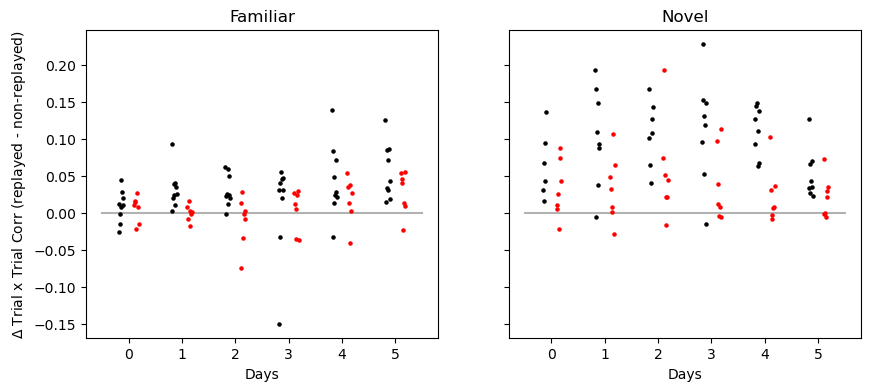

In [18]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
# ax[0].scatter(x, _df['fam_activated'], color='black', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='black', s=5)
ax[0].scatter(x, _df['fam_diff'], color='black', s=5)
ax[1].scatter(x, _df['nov_diff'], color='black', s=5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax[0].scatter(x, _df['fam_activated'], color='red', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='red', s=5)
ax[0].scatter(x, _df['fam_diff'], color='red', s=5)
ax[1].scatter(x, _df['nov_diff'], color='red', s=5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')
    
ax[0].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)


ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel(r'$\Delta$ Trial x Trial Corr (replayed - non-replayed)')


In [19]:
df.head()

,ctrl/cre,day,mouse,m,nov_activated,nov_activated_histcounts,nov_nonactivated,nov_nonactivated_histcounts,fam_activated,fam_activated_histcounts,fam_nonactivated,fam_nonactivated_histcounts,nov_diff,fam_diff
0,ctrl,0,4467331.1,0,0.299990,"[19, 7, 5, 3, 1, 8, 1, 2, 4, 6, 2, 9, 4, 6, 3,...",0.164433,"[298, 128, 79, 58, 32, 33, 38, 31, 19, 18, 19,...",0.151199,"[110, 67, 48, 35, 27, 22, 15, 25, 18, 15, 19, ...",0.140206,"[267, 126, 68, 42, 31, 17, 18, 24, 28, 8, 11, ...",0.135557,0.010993
1,ctrl,0,4467331.2,1,0.107551,"[32, 15, 8, 10, 6, 7, 3, 3, 1, 5, 2, 0, 2, 1, ...",0.064994,"[424, 129, 102, 53, 34, 38, 31, 25, 16, 12, 11...",0.067361,"[164, 106, 47, 37, 19, 19, 15, 12, 9, 6, 7, 3,...",0.047233,"[405, 138, 70, 36, 32, 20, 13, 13, 8, 10, 7, 8...",0.042556,0.020129
2,ctrl,0,4467332.1,2,0.170552,"[21, 14, 16, 11, 13, 7, 11, 9, 7, 6, 6, 10, 5,...",0.075715,"[429, 188, 145, 73, 55, 52, 35, 36, 25, 17, 18...",0.093865,"[128, 94, 79, 55, 47, 39, 34, 20, 23, 18, 7, 1...",0.066150,"[344, 183, 93, 59, 63, 48, 22, 27, 26, 17, 16,...",0.094837,0.027715
3,ctrl,0,4467332.2,3,0.066334,"[38, 27, 25, 17, 16, 8, 3, 5, 7, 1, 3, 2, 2, 0...",0.050985,"[461, 296, 136, 108, 76, 43, 40, 45, 23, 22, 1...",0.089215,"[137, 91, 72, 39, 26, 24, 20, 18, 13, 10, 8, 7...",0.082102,"[352, 222, 117, 78, 69, 52, 38, 37, 29, 26, 11...",0.015349,0.007113
4,ctrl,0,4467333.1,4,0.156611,"[35, 25, 22, 18, 17, 14, 14, 7, 5, 6, 7, 5, 8,...",0.089930,"[389, 175, 107, 73, 62, 28, 30, 30, 30, 21, 23...",0.123059,"[123, 71, 69, 52, 29, 29, 27, 19, 10, 22, 14, ...",0.078583,"[392, 149, 92, 75, 33, 28, 22, 22, 12, 11, 14,...",0.066681,0.044476


147
1096


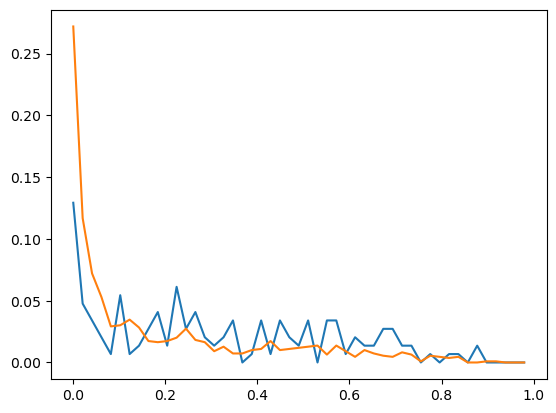

In [20]:
mask = (df['mouse']==ctrl_mice[0])*(df['day']==0)
_df = df[mask]
# _df['nov_activated_histcounts']
fig, ax= plt.subplots()
na = _df['nov_activated_histcounts'].iloc[0]
print(na.sum())
na = na/na.sum()
ax.plot(edges[:-1], na)
nna = _df['nov_nonactivated_histcounts'].iloc[0]
print(nna.sum())
nna = nna/nna.sum()
ax.plot(edges[:-1], nna)


In [21]:
df.columns

Index(['ctrl/cre', 'day', 'mouse', 'm', 'nov_activated',
       'nov_activated_histcounts', 'nov_nonactivated',
       'nov_nonactivated_histcounts', 'fam_activated',
       'fam_activated_histcounts', 'fam_nonactivated',
       'fam_nonactivated_histcounts', 'nov_diff', 'fam_diff'],
      dtype='object')

In [24]:
aov = mixed_anova(data=df[df['day']<5], dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.043533    1   10  0.043533  8.592011  0.015010  0.462135   
1          day  0.003630    4   40  0.000907  0.541598  0.706059  0.051377   
2  Interaction  0.003424    4   40  0.000856  0.510873  0.728031  0.048604   

        eps  
0       NaN  
1  0.757408  
2       NaN  


In [25]:
aov = mixed_anova(data=df[df['day']<5], dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.009160    1   14  0.009160  5.754731  0.030934  0.291309   
1          day  0.007233    4   56  0.001808  1.572133  0.194391  0.100958   
2  Interaction  0.004285    4   56  0.001071  0.931261  0.452523  0.062370   

       eps  
0      NaN  
1  0.40194  
2      NaN  


# correlation across days

In [26]:
def get_cell_orders(mouse, session_deets, days, match_inds):
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
            
    
    cell_order = []
    for day in days:
        deets = session_deets[day]
        if isinstance(deets,tuple):
            roi_inds = []
            for _deets in deets:
                roi_inds.append(_deets['ravel_ind'])
            print(roi_inds)
            mapping = u.common_rois(match_inds, roi_inds)
            
            # print(common_roi_mapping.shape)
            cell_order.append(mapping[0,:].tolist())
        else:
            # with open(hse_dict[cond_key][day][mouse], 'rb') as file:
            #     hse = pickle.load(file)
            cell_order.append([])
    return cell_order

def common_rois_adjust(mouse, days):
    if mouse in ctrl_mice:
        session_deets = stx.ymaze_sess_deets.CTRL_sessions[mouse]
    else:
        session_deets = stx.ymaze_sess_deets.KO_sessions[mouse]
    
    
    ravel_inds = []
    day_inds = []
    for day in days:
        deets = session_deets[day]
        if isinstance(deets, tuple):
            for _deets in deets:
                ravel_inds.append(_deets['ravel_ind'])
                day_inds.append(day)
        else:
            ravel_inds.append(deets['ravel_ind'])
            day_inds.append(day)

    pkldir = os.path.join('/home/mplitt/YMazeSessPkls/', mouse)
    with open(os.path.join(pkldir, "roi_aligner_results.pkl"), 'rb') as file:
        match_inds = dill.load(file)
    # print(match_inds.keys(), ravel_inds)
    

    common_roi_mapping = u.common_rois(match_inds, ravel_inds)

    c_rows = []
    for i, d in enumerate(day_inds):
        if d != day_inds[i-1]:
            c_rows.append(i)
    
    # print(c_rows)
    common_roi_mapping = common_roi_mapping[c_rows,:]
    cell_order = get_cell_orders(mouse,session_deets, days, match_inds)

    roi_mapping_adj = np.zeros(common_roi_mapping.shape)
    c_cols = []
    for row, order in enumerate(cell_order):
        croi = common_roi_mapping[row,:]

        if len(order)==0:
            roi_mapping_adj[row,:] = croi
        else:
            # print(len(order), common_roi_mapping.shape)
            for col, _c in enumerate(croi):
                match = np.argwhere(order==_c)
                if len(match)>0:
                    c_cols.append(col)
                    roi_mapping_adj[row,col]=match[0][0]
                    # print(_c, match[0][0])
                    
    if len(c_cols) !=0:
        roi_mapping_adj = roi_mapping_adj[:,c_cols]
    return roi_mapping_adj.astype(int)


In [27]:
def predict_future_tt_stability(mouse):
    print(mouse)
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
    corr_dict = {}
    for react_day in range(5):
        corr_dict[react_day] = {}
        for tt_corr_day in range(react_day+1,6):
            corr_dict[react_day][tt_corr_day] ={}
            days = [react_day, tt_corr_day]

            common_roi_mapping = common_rois_adjust(mouse, days)


            with open(hse_dict[cond_key][react_day][mouse], 'rb') as file:
                hse_react = pickle.load(file)

            
            
            # trial matrix 
            with open(hse_dict[cond_key][tt_corr_day][mouse], 'rb') as file:
                hse_tt_corr = pickle.load(file)
                
            for key, coef  in zip(('fam', 'nov'), (-1,1)):
                corr_dict[react_day][tt_corr_day][key] = {}
                          
                # reactivation mask 
                react_mask = hse_react.post_reward_activation_mask[common_roi_mapping[0,:],:][:, hse_react.lr==coef*hse_react.novel_arm].sum(axis=-1)>0
                tmat = hse_tt_corr.trial_mat[:, : , common_roi_mapping[1, :]][hse_tt_corr.trial_info['LR'] == coef*hse_tt_corr.novel_arm, :, :]


                ## trial x trial correlation
                tt_corr_mat = sp.stats.zscore(tmat, axis=1, nan_policy='omit')
                tt_corr_mat[np.isnan(tt_corr_mat)]=0
                tt_corr_mat = 1/(tmat.shape[1]-1)*np.matmul(np.transpose(tt_corr_mat, axes=(2, 0, 1)), np.transpose(tt_corr_mat, axes=(2, 1, 0)))
                # print(np.isnan(tt_corr_mat).sum())
                for cell in range(tt_corr_mat.shape[0]):
                    _mat = tt_corr_mat[cell,:, :]
                    _mat[np.diag_indices_from(_mat)]=np.nan
                    tt_corr_mat[cell, :, :] = _mat

                corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(np.nanmean(tt_corr_mat[react_mask,:,:], axis=-1), axis=-1)
                corr_dict[react_day][tt_corr_day][key]['nonactivated']=np.nanmean(np.nanmean(tt_corr_mat[~react_mask,:,:], axis=-1), axis=-1)
    return corr_dict



In [28]:
ctrl_results = {mouse:predict_future_tt_stability(mouse) for mouse in ctrl_mice}    

4467331.1
4467331.2
[3, 4]
[3, 4]
[3, 4]
[3, 4]
[3, 4]
4467332.1
4467332.2
[2, 3]
[2, 3]
[2, 3]
[2, 3]
[2, 3]
4467333.1
mCherry6
mCherry7
mCherry8
mCherry9


In [29]:
cre_results = {mouse:predict_future_tt_stability(mouse) for mouse in ko_mice}  

4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
Cre7
Cre9


In [30]:
ctrl_act = np.zeros((len(ctrl_mice),2,6,6))
ctrl_nonact = np.zeros((len(ctrl_mice),2,6,6))
 
key = 'fam'    
    
for m, mouse in enumerate(ctrl_mice):
    # fig, ax = plt.subplots(1,3, figsize=[9,3])
    # fig.suptitle(mouse)
    
    res = ctrl_results[mouse]
    
    # act = np.zeros((6,6))*np.nan
    # nonact = np.zeros((6,6))*np.nan
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                # act[r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                # nonact[r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])

                ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                ctrl_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
    # ax[0].imshow(act, cmap='magma', vmin=0, vmax=.4)
    # ax[1].imshow(nonact, cmap='magma', vmin=0, vmax=.4)
    # ax[2].imshow(act-nonact, cmap='seismic', vmin=-.2, vmax=.2)
    
    
cre_act = np.zeros((len(ko_mice),2, 6, 6))
cre_nonact = np.zeros((len(ko_mice),2, 6,6))
                    
for m, mouse in enumerate(ko_mice):
    # fig, ax = plt.subplots(1,3, figsize=[9,3])
    fig.suptitle(mouse)
    
    res = cre_results[mouse]
    
    # act = np.zeros((6,6))*np.nan
    # nonact = np.zeros((6,6))*np.nan
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                # act[r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                # nonact[r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])

                cre_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                cre_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
    # ax[0].imshow(act, cmap='magma', vmin=0, vmax=.4)
    # ax[1].imshow(nonact, cmap='magma', vmin=0, vmax=.4)
    # ax[2].imshow(act-nonact, cmap='seismic', vmin=-.2, vmax=.2)


/tmp/ipykernel_2652044/646636121.py:20: RuntimeWarning: Mean of empty slice
  ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])


fam
ctrl vs cre 2.9478518217091447 0.01059082587258258
ctrl 1.7788163262402261 0.1131546165852408
cre -2.540120691605931 0.04407373640712127
nov
ctrl vs cre 2.8614638451306984 0.012562568902455105
ctrl 5.353119122730626 0.0006832876997337878
cre 1.9828500449911624 0.09464930965955119


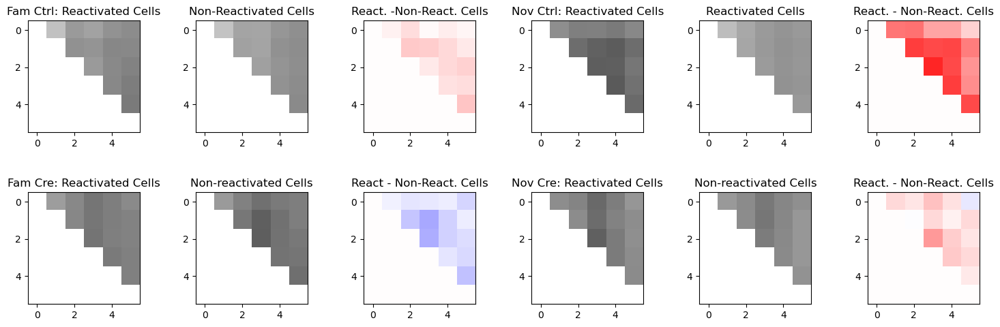

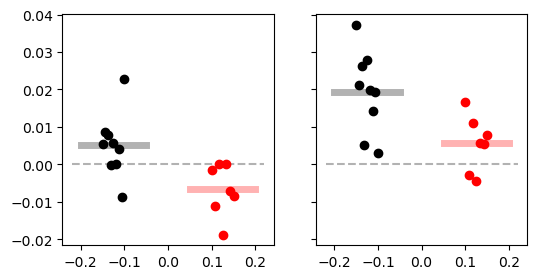

In [31]:
fig, ax = plt.subplots(2,6, figsize = [18,6])
fig.subplots_adjust(wspace=.5)
ax[0,0].imshow(np.nanmean(ctrl_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[0,0].set_title('Fam Ctrl: Reactivated Cells')
ax[0,1].imshow(np.nanmean(ctrl_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[0,1].set_title('Non-Reactivated Cells')
ax[0,2].imshow(np.nanmean(ctrl_act[:, 0, :, :]-ctrl_nonact[:, 0, :, :], axis=0), cmap='seismic', vmin=-.2, vmax=.2)
ax[0,2].set_title('React. -Non-React. Cells')

ax[0,3].imshow(np.nanmean(ctrl_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[0,3].set_title('Nov Ctrl: Reactivated Cells')
ax[0,4].imshow(np.nanmean(ctrl_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[0,4].set_title('Reactivated Cells')
ax[0,5].imshow(np.nanmean(ctrl_act[:, 1, :, :]-ctrl_nonact[:, 1, :, :], axis=0), cmap='seismic', vmin=-.2, vmax=.2)
ax[0,5].set_title('React. - Non-React. Cells')


ax[1,0].imshow(np.nanmean(cre_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[1,0].set_title('Fam Cre: Reactivated Cells')
ax[1,1].imshow(np.nanmean(cre_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[1,1].set_title('Non-reactivated Cells')
ax[1,2].imshow(np.nanmean(cre_act[:, 0, :, :]-cre_nonact[:, 0, :, :], axis=0), cmap='seismic', vmin=-.2, vmax=.2)
ax[1,2].set_title('React - Non-React. Cells')

ax[1,3].imshow(np.nanmean(cre_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[1,3].set_title('Nov Cre: Reactivated Cells')
ax[1,4].imshow(np.nanmean(cre_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
ax[1,4].set_title('Non-reactivated Cells')
ax[1,5].imshow(np.nanmean(cre_act[:, 1, :, :]-cre_nonact[:, 1, :, :], axis=0), cmap='seismic', vmin=-.2, vmax=.2)
ax[1,5].set_title('React. - Non-React. Cells')


fig, ax= plt.subplots(1,2, figsize = [6,3], sharey=True)
ctrl_x = np.linspace(-.15,-.1, num=len(ctrl_mice))
cre_x = np.linspace(.1,.15, num=len(ko_mice))

ctrl_diff = np.nanmean(np.nanmean(ctrl_act-ctrl_nonact,axis=-1), axis=-1)
cre_diff = np.nanmean(np.nanmean(cre_act-cre_nonact,axis=-1), axis=-1)
ax[0].scatter(ctrl_x, ctrl_diff[:, 0], color='black')
ax[0].plot([-.2,-.05], ctrl_diff[:,0].mean()*np.ones((2,)), color='black', alpha=.3, linewidth=5)
ax[0].scatter(cre_x, cre_diff[:, 0], color='red')
ax[0].plot([.05,.2], cre_diff[:,0].mean()*np.ones((2,)), color='red', alpha=.3, linewidth=5)
ax[0].plot([-.22, .22], [0, 0], 'k--', alpha=.3, zorder=-1)
print('fam')
t,p = sp.stats.ttest_ind(ctrl_diff[:,0], cre_diff[:,0])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,0], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,0], 0)
print('cre', t,p)

ax[1].scatter(ctrl_x, ctrl_diff[:, 1], color='black')
ax[1].plot([-.2,-.05], ctrl_diff[:,1].mean()*np.ones((2,)), color='black', alpha=.3, linewidth=5)
ax[1].scatter(cre_x, cre_diff[:, 1], color='red')
ax[1].plot([.05,.2], cre_diff[:,1].mean()*np.ones((2,)), color='red', alpha=.3, linewidth=5)
ax[1].plot([-.22, .22], [0, 0], 'k--', alpha=.3, zorder=-1)
print('nov')
t,p = sp.stats.ttest_ind(ctrl_diff[:,1], cre_diff[:,1])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,1], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,1], 0)
print('cre', t,p)



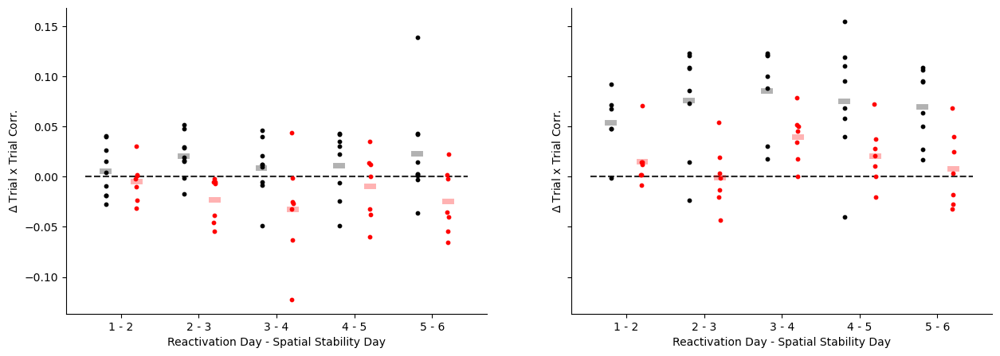

In [32]:
ctrl_diff = ctrl_act-ctrl_nonact
cre_diff = cre_act-cre_nonact

ctrl_x = -1 + np.linspace(.05,.05, num=len(ctrl_mice))
cre_x = 1 + np.linspace(-.05,.05, num=len(ko_mice))

fig, ax = plt.subplots(1,2, figsize=[15,5], sharey=True)

s=10
lw=5
for a in range(2):
    for react_day, tt_corr_day in zip(range(5), range(1,6)):
        ax[a].scatter(ctrl_x+5*react_day, ctrl_diff[:,a, react_day, tt_corr_day] , color='black', s=s)
        ax[a].plot(5*react_day -1 + np.array([-.2, .2]), np.nanmean(ctrl_diff[:, a, react_day, tt_corr_day])*np.ones([2,]), linewidth=lw, color='black',
                   alpha=.3)

        ax[a].scatter(cre_x + 5*react_day, cre_diff[:, a, react_day, tt_corr_day], color='red', s=s)
        ax[a].plot(5*react_day +1 + np.array([-.2, .2]), np.nanmean(cre_diff[:, a, react_day, tt_corr_day])*np.ones([2,]), linewidth=lw, color='red',
                   alpha=.3)
    
        ax[a].plot([-2.3, 22.3], [0, 0], 'k--', alpha=.3, zorder= -1)
        
        ax[a].set_xticks(np.arange(0,5*5,5))
        ax[a].set_xticklabels([f'{x} - {x+1}' for x in range(1,6)])

        ax[a].spines['top'].set_visible(False)
        ax[a].spines['right'].set_visible(False)
        
        ax[a].set_xlabel('Reactivation Day - Spatial Stability Day')
        ax[a].set_ylabel(r'$\Delta$ Trial x Trial Corr.')



In [ ]:
#  correlation of rate map across days 

In [ ]:
# same cells reactivated each time?

# proportion of events that cell participates in within day and across days

# examples of reactivated cells 